# MD008 Redes Neuronales Entrega 2: MPL-D2

Este proyecto nace de la colaboración rollo hackathon/LAN party de redes neuronales de Bernat Delgado y Josep Segarra. Después de un fin de semana de puro pythorch, cerveza, Torrente, Alonso, mínimas horas de sueño y el aprendizaje de como girar una tortilla de patatas, este ha sido el resultado de la comunión entre dos leyendas del Data Science. 

Hemos escogido el caso de los relojes y lo hemos dividido en 3 partes:
* Una regresión hecha con las herramientas vistas en clase, juntando pooling y convoluciones para intentar llegar a un resultado satisfactorio, aunque este no nos acabó de sorprender.
* Una segunda regresión, esta vez añadiendo ciertas transformaciones y un tratado especial a los datos para tratar de conseguir mejores resultados.
* Por último, una clasificación en la que dividimos el precio de los relojes en rangos de precio para tratar de conseguir el precio orientativo mediante los limites de el rango en cuestion, por ejemplo, si un reloj es rango 3 significaría que el precio se encuentra entre los 1000 y 1500€.

## PRIMER INTENTO: REGRESION

In [4]:
# Import libraries
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torchvision
import torch.nn as nn
import os
from torchvision.transforms import ToTensor
from PIL import Image
import torch.optim as optim
import numpy as np
from sklearn.metrics import mutual_info_score

In [5]:
# Read Watches dataset to dataframe.
raw_data = pd.read_csv('.\\watches\\metadata.csv')

# Drop first column as i represnt the index.
raw_data = raw_data.drop(raw_data.columns[0], axis=1)
image_names = raw_data['image_name']
prices = raw_data['price']
raw_data.head()

,brand,name,price,image_name
0,Versace,Greca Logo Watch,"$2,780.00",0.jpg
1,Fitbit,Fitbit Sense 2 Smart Watch,$449.95,1.jpg
2,TW Steel,Volante 45mm Men's Watch,$399.00,2.jpg
3,Armani Exchange,Dark Brown Chronograph Watch,$349.00,3.jpg
4,TW Steel,Canteen 45mm Men's Watch,$549.00,4.jpg


Lo primero que haremos para el tratamiento de los datos será cambiar la columna del precio de String a su correspondiente float.

In [6]:
# Transform prices content '$2,780.00' to float 2780.00
prices = prices.str.replace('$', '')
prices = prices.str.replace(',', '')
prices = prices.astype(float)

C:\Users\josep\AppData\Local\Temp\ipykernel_6324\1094512273.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  prices = prices.str.replace('$', '')


A continuación aplicamos una serie de transformaciones para convertir la informacion en algo con lo que podamos trbajar

In [7]:
images_dir = '.\\watches\\images\\'
images_tensor = [ToTensor()(Image.open(os.path.join(images_dir, img_name))) for img_name in image_names]

images_tensor = torch.stack(images_tensor)
prices_tensor = torch.tensor(prices.values, dtype=torch.float32)

In [8]:
# Create a TensorDataset
dataset = torch.utils.data.TensorDataset(images_tensor, prices_tensor)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=4, shuffle=True)

print('first image tensor shape:', images_tensor[0])

first image tensor shape: tensor([[[0.9961, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9922, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [0.9608, 0.9608, 0.9608,  ..., 0.9529, 0.9529, 0.9529],
         ...,
         [0.9529, 0.9529, 0.9529,  ..., 0.9529, 0.9529, 0.9529],
         [0.9922, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9961, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9922, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [0.9608, 0.9608, 0.9608,  ..., 0.9529, 0.9529, 0.9529],
         ...,
         [0.9529, 0.9529, 0.9529,  ..., 0.9529, 0.9529, 0.9529],
         [0.9922, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9961, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9922, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [0.9608, 0.9608, 0.9608

In [9]:
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

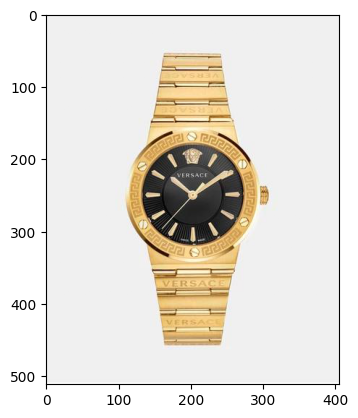

Price: tensor(2780.)


In [10]:
# Plot first image from dataset tensor.
plt.imshow(dataset[0][0].permute(1, 2, 0))
plt.show()

print('Price:', dataset[0][1])

Una vez sabemos que ya tenemos los datos bien puestos, procedemos a convertirlo en un dataframe y trabajarlos un poco.

In [11]:
all_data = [(image.permute(1, 2, 0).numpy(), label) for image, label in dataset]

all_images = [data[0] for data in all_data]
all_labels = [data[1] for data in all_data]

df = pd.DataFrame({'image': all_images, 'label': prices})

df.head()

,image,label
0,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",2780.00
1,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",449.95
2,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",399.00
3,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,...",349.00
4,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",549.00


In [12]:
# Get max and min label values.
max_label = df['label'].max()
min_label = df['label'].min()

print('Max label:', max_label)
print('Min label:', min_label)

Max label: 3675.0
Min label: 30.95


In [13]:
# Transform label from price to price range to transform regression problem to classification problem knowing max and min label values.
df['label_range'] = pd.cut(df['label'], bins=8, labels=[1, 2, 3, 4, 5, 6, 7, 8])

print('We can calculate the rang of each label as: {(label*500 - 500) to (label * 500)}')
df.head()

We can calculate the rang of each label as: {(label*500 - 500) to (label * 500)}


,image,label,label_range
0,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",2780.00,7
1,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",449.95,1
2,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",399.00,1
3,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,...",349.00,1
4,"[[[0.99607843, 0.99607843, 0.99607843], [0.996...",549.00,2


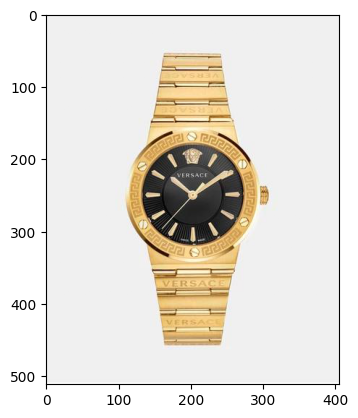

In [14]:
first_image_data = df.loc[0, 'image']

plt.imshow(first_image_data)
plt.show()

Ahora es momento de empezar el tratamiento para optimizar nuestra red neuronal, ya que si trataramos de entrenarla con los datos tal y como los tenemos ahora, el entrenamiento hubiera tardado todo el fin de semana. Para reducir el tamaño de las imagenes a algo con lo que podamos trabajar primero aplicaremos pooling.

In [15]:
from skimage.measure import block_reduce

# Creamos una matriz para almacenar los valores de información mutua
mutual_info_array = np.zeros((406//4, 512//4))  # Ajustamos el tamaño de la matriz al pooling

# Hacemos pooling de las imágenes
pooled_images = [block_reduce(img, block_size=(4, 4, 1), func=np.mean) for img in df['image']]

# Transform pooled images to dataframe.
pooled_images = pd.DataFrame({'image': pooled_images, 'label': df['label'], 'label_range': df['label_range']})

# Iteramos sobre cada pixel
total_pixels = (406//4) * (512//4)

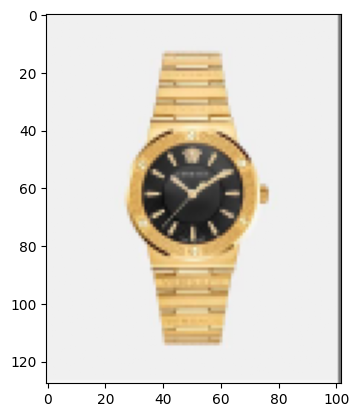

In [16]:
# Plot image
plt.imshow(pooled_images['image'][0])
plt.show()

Como observamos hemos reducido el tamaño una barbaridad y aun así no hemos perdido mucha calidad de la imagen.

In [17]:
print(mutual_info_array.shape)

(101, 128)


A continuacion buscaremos el mapa de calor de las imagenes para saber que pixeles aportan más informacion y asi poder deshacernos del resto.

c:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
c:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
c:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
c:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarni

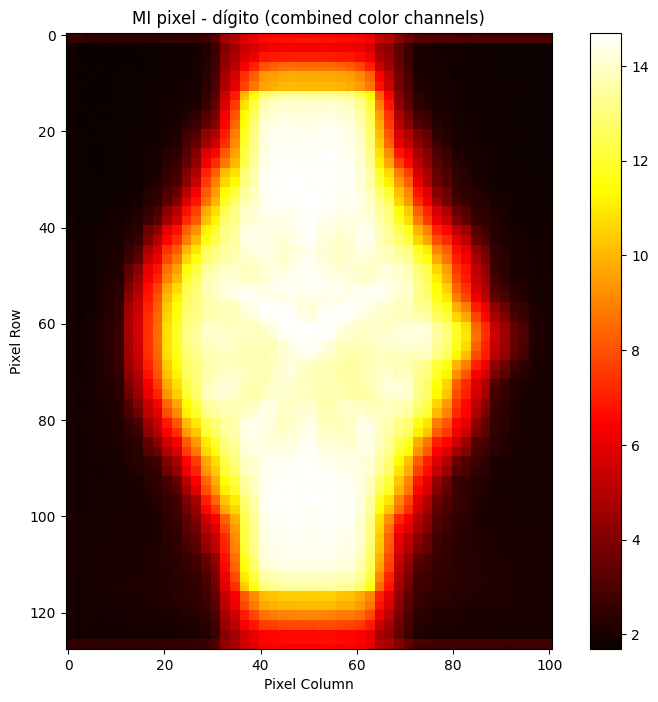

In [18]:
from sklearn.metrics import mutual_info_score
import numpy as np

# Definimos una función para calcular la información mutua para un pixel
def calculate_mi(i, j):
    # Extraemos los valores de los canales de color para el pixel actual
    pixel_values = [img[i, j, :] for img in pooled_images['image']]

    # Calculamos la información mutua para cada canal de color
    mi_values = [mutual_info_score(channel_values, pooled_images['label']) for channel_values in zip(*pixel_values)]

    return sum(mi_values)

# Creamos una matriz para almacenar los valores de información mutua
mutual_info_array = np.zeros((512//4, 406//4))  # Eliminamos la dimensión para los canales de color

current_pixel = 0
for i in range(512//4):
    for j in range(406//4):
        # Calculamos la información mutua
        mutual_info_array[i, j] = calculate_mi(i, j)

# Visualizamos la información mutua
plt.figure(figsize=(10, 8))
plt.imshow(mutual_info_array, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('MI pixel - dígito (combined color channels)')
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.show()

In [19]:
mi_threshold = np.percentile(mutual_info_array, 70)

high_mi_indices = np.where(mutual_info_array > mi_threshold)

min_row, max_row = np.min(high_mi_indices[0]), np.max(high_mi_indices[0])
min_col, max_col = np.min(high_mi_indices[1]), np.max(high_mi_indices[1])

reduced_images = [img[min_row:max_row, min_col:max_col, :] for img in pooled_images['image']]
reduced_mutual_info_array = mutual_info_array[min_row:max_row, min_col:max_col]


reduced_images_df = pd.DataFrame({'image': reduced_images, 'label': pooled_images['label']})

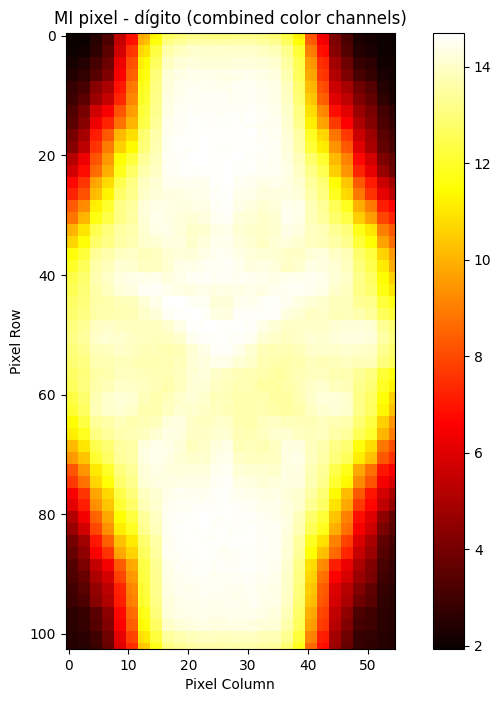

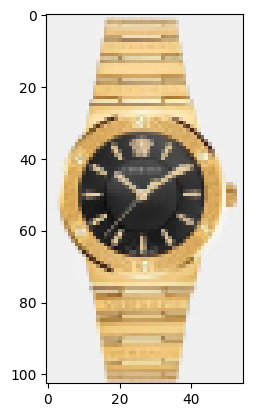

In [20]:
# Plot new reduced mutual information array.
plt.figure(figsize=(10, 8))
plt.imshow(reduced_mutual_info_array, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('MI pixel - dígito (combined color channels)')
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.show()

# Plot reduced image.
plt.imshow(reduced_images_df['image'][0])

In [21]:
# Compare initial num pixels and reduced num pixels.
print('Initial num pixels:', 512*406)
print('Reduced num pixels:', reduced_mutual_info_array.shape[0] * reduced_mutual_info_array.shape[1])
print('Row pixels:', reduced_mutual_info_array.shape[0])
print('Column pixels:', reduced_mutual_info_array.shape[1])

Initial num pixels: 207872
Reduced num pixels: 5665
Row pixels: 103
Column pixels: 55


En la celda anterior podemos apreciar lo mucho que hemos reducido el tamaño de nuestras muestras.

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from torchvision.datasets import MNIST
import matplotlib.pyplot as plt
import numpy as np

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(device)

# Define the CNN model
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(8 * 51 * 27, 4)
        self.fc2 = nn.Linear(4, 1)

    def forward(self, x):
        x = x.squeeze(1)
        x = x.permute(0, 3, 1, 2)
        x = self.conv1(x)
        x = self.pool(x)
        x = x.contiguous().view(x.size(0), -1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Calculate num parameters of the model.
model = CNN().to(device)
num_params = sum(p.numel() for p in model.parameters())
print('Number of parameters:', num_params)

cpu
Number of parameters: 44297


Podriamos poner más parámetros sin embargo, el resultado se vuelve incluso peor.

In [23]:
# Define the loss function and optimizer
criterion = nn.MSELoss()  # Use Mean Squared Error loss for regression
optimizer = optim.Adam(model.parameters(), lr=0.005)

# Function to train the model
def train_model(model, train_loader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)
        epoch_loss = running_loss / len(train_loader.dataset)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}')

# Function to evaluate the model
def evaluate_model(model, test_loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
    avg_loss = total_loss / len(test_loader.dataset)
    print(f'Average loss on test set: {avg_loss:.4f}')
    print(f'RMSE: {np.sqrt(avg_loss):.4f}') 

In [24]:
X = reduced_images_df.drop(columns=['label'])
y = reduced_images_df['label']

# Print X and y.
print(X.head())
print(y.head())


                                               image
0  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
1  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
2  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
3  [[[0.9058821, 0.9058821, 0.9058821], [0.905882...
4  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
0    2780.00
1     449.95
2     399.00
3     349.00
4     549.00
Name: label, dtype: float64


In [25]:
# transform reduced images to loaders
X = torch.stack([torch.Tensor(i) for i in X.values.tolist()])
y = torch.tensor(y.values, dtype=torch.float32)

# Print shapes of X and y.
print(X.shape)
print(y.shape)


C:\Users\josep\AppData\Local\Temp\ipykernel_6324\1834241498.py:2: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:278.)
  X = torch.stack([torch.Tensor(i) for i in X.values.tolist()])


torch.Size([2553, 1, 103, 55, 3])
torch.Size([2553])


In [26]:
dataset = TensorDataset(X, y)
len(dataset)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=2042, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=511, shuffle=False)

In [27]:
train_model(model, train_loader, criterion, optimizer, num_epochs=100)

c:\Users\josep\anaconda3\lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([2042])) that is different to the input size (torch.Size([2042, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/100], Loss: 386768.5000
Epoch [2/100], Loss: 368660.1562
Epoch [3/100], Loss: 347402.7812
Epoch [4/100], Loss: 322066.4688
Epoch [5/100], Loss: 293805.2188
Epoch [6/100], Loss: 264547.4688
Epoch [7/100], Loss: 237259.3594
Epoch [8/100], Loss: 216136.0625
Epoch [9/100], Loss: 206300.3906
Epoch [10/100], Loss: 211445.3750
Epoch [11/100], Loss: 226474.5312
Epoch [12/100], Loss: 237344.3281
Epoch [13/100], Loss: 237480.0000
Epoch [14/100], Loss: 229755.3594
Epoch [15/100], Loss: 219547.0938
Epoch [16/100], Loss: 211009.5469
Epoch [17/100], Loss: 206103.2656
Epoch [18/100], Loss: 204877.5156
Epoch [19/100], Loss: 206253.6094
Epoch [20/100], Loss: 208825.4844
Epoch [21/100], Loss: 211388.2656
Epoch [22/100], Loss: 213153.0625
Epoch [23/100], Loss: 213749.2031
Epoch [24/100], Loss: 213141.7656
Epoch [25/100], Loss: 211538.9844
Epoch [26/100], Loss: 209312.7188
Epoch [27/100], Loss: 206926.5000
Epoch [28/100], Loss: 204855.8594
Epoch [29/100], Loss: 203491.5000
Epoch [30/100], Loss: 2

In [28]:
evaluate_model(model, test_loader)

Average loss on test set: 197688.9062
RMSE: 444.6222


c:\Users\josep\anaconda3\lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([511])) that is different to the input size (torch.Size([511, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Apreciamos como nuestro RMSE no es malo en si, un error de 400 euros podria ser tolerable si tan solo queremos usarlo como una guia para el precio del reloj. Sin embargo en la grafica siguiente se observará el porque no es del todo representativo.

images shape: torch.Size([511, 1, 103, 55, 3])


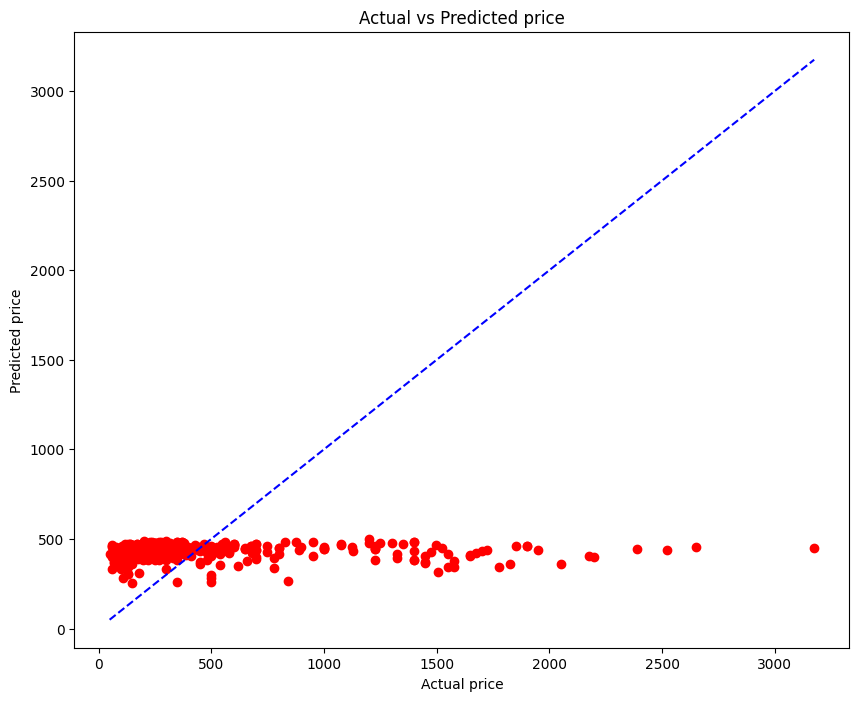

In [30]:
# Plot predictions vs actual prices
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        print('images shape:', images.shape)
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        break

outputs = outputs.cpu().numpy()
labels = labels.cpu().numpy()

plt.figure(figsize=(10, 8))
plt.scatter(labels, outputs, c='r')
plt.plot([min(labels), max(labels)], [min(labels), max(labels)], '--', c='b')
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Actual vs Predicted price')
plt.show()

Como se observa, el modelo es incapaz de asignarle un valor mayor de 500 al precio, eso se debe a que la mayoria de relojes se concentran entre 0 y 500€ y por ello el modelo no sabe predecir bien. Para solucionar esto, intentamos varias cosas como replicar los relojes de mayor precio o quedarnos solo con la correa del reloj, pero no conseguimos ningun cambio, hasta que empezamos a jugar como locos en este segundo intento.

## SEGUNDO INTENTO: REGRESION

In [1]:
# Import libraries
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torchvision
import torch.nn as nn
import os
from torchvision.transforms import ToTensor
from PIL import Image
import torch.optim as optim
import numpy as np
from sklearn.metrics import mutual_info_score

In [2]:
# Read Watches dataset to dataframe.
raw_data = pd.read_csv('.\\watches\\metadata.csv')

# Drop first column as i represnt the index.
raw_data = raw_data.drop(raw_data.columns[0], axis=1)
image_names = raw_data['image_name']
prices = raw_data['price']
raw_data.head()

,brand,name,price,image_name
0,Versace,Greca Logo Watch,"$2,780.00",0.jpg
1,Fitbit,Fitbit Sense 2 Smart Watch,$449.95,1.jpg
2,TW Steel,Volante 45mm Men's Watch,$399.00,2.jpg
3,Armani Exchange,Dark Brown Chronograph Watch,$349.00,3.jpg
4,TW Steel,Canteen 45mm Men's Watch,$549.00,4.jpg


In [3]:
# Transform prices content '$2,780.00' to float 2780.00
prices = prices.str.replace('$', '')
prices = prices.str.replace(',', '')
prices = prices.astype(float)

Aqui es donde este segundo intento empieza a diferir del primero, como se puede observar en la siguiente celda, nada mas leer las imagenes ya empezamos a aplicarles transformaciones, como por ejemplo rotarlas para ver si de este modo los relojes se diferencian un poco mas entre si.

In [4]:
from torchvision import transforms

img_size = 400
pooling_size = 4

# Definición de transformaciones para el preprocesamiento de imágenes
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),  # Redimensionar las imágenes
    transforms.RandomHorizontalFlip(),  # Aumento de datos: volteo horizontal aleatorio
    transforms.RandomRotation(10),  # Aumento de datos: rotación aleatoria
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar con los valores de ImageNet
])

In [5]:
images_dir = '.\\watches\\images\\'
# images_tensor = [ToTensor()(Image.open(os.path.join(images_dir, img_name))) for img_name in image_names]
images_tensor = torch.stack([transform(Image.open(os.path.join(images_dir, img_name))) for img_name in image_names])


# images_tensor = torch.stack(images_tensor)
prices_tensor = torch.tensor(prices.values, dtype=torch.float32)

In [6]:
# Create a TensorDataset
dataset = torch.utils.data.TensorDataset(images_tensor, prices_tensor)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=4, shuffle=True)

print('first image tensor shape:', images_tensor[0])

first image tensor shape: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])


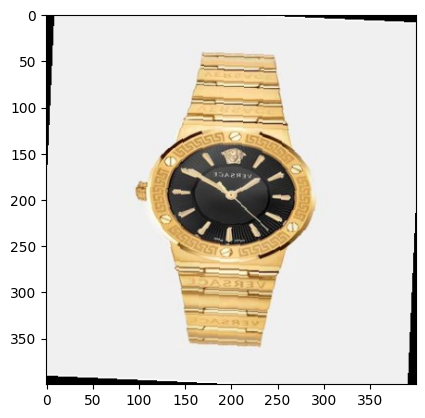

Price: tensor(2780.)


In [7]:
# Plot first image from dataset tensor.
plt.imshow(dataset[0][0].permute(1, 2, 0))
plt.show()

print('Price:', dataset[0][1])

Como obserrvamos, esta primera imagen ya no es igual que antes, todas las imagenes han sufrido una transformacion con la que esperamos que podamos encontrar mejor las diferencias.

In [8]:
all_data = [(image.permute(1, 2, 0).numpy(), label) for image, label in dataset]

all_images = [data[0] for data in all_data]
all_labels = [data[1] for data in all_data]

df = pd.DataFrame({'image': all_images, 'label': prices})

df.head()

,image,label
0,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",2780.00
1,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",449.95
2,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",399.00
3,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",349.00
4,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",549.00


In [9]:
# Get max and min label values.
max_label = df['label'].max()
min_label = df['label'].min()

print('Max label:', max_label)
print('Min label:', min_label)

Max label: 3675.0
Min label: 30.95


A continuacion generamos los rangos para la clasificacion que haremos mas tarde.

In [10]:
# Transform label from price to price range to transform regression problem to classification problem knowing max and min label values.
df['label_range'] = pd.cut(df['label'], bins=8, labels=[1, 2, 3, 4, 5, 6, 7, 8])

print('We can calculate the rang of each label as: {(label*500 - 500) to (label * 500)}')
df.head()

We can calculate the rang of each label as: {(label*500 - 500) to (label * 500)}


,image,label,label_range
0,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",2780.00,7
1,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",449.95,1
2,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",399.00,1
3,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",349.00,1
4,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",549.00,2


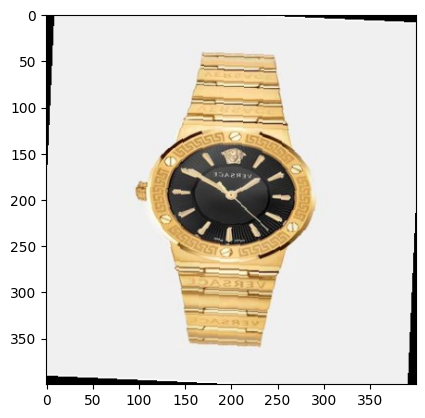

In [11]:
first_image_data = df.loc[0, 'image']

plt.imshow(first_image_data)
plt.show()

Una vez mas aplicamos pooling y analisis de informacion para reducir el tamaño.

In [12]:
from skimage.measure import block_reduce


# Creamos una matriz para almacenar los valores de información mutua
mutual_info_array = np.zeros((img_size//pooling_size, img_size//pooling_size))  # Ajustamos el tamaño de la matriz al pooling

# Hacemos pooling de las imágenes
pooled_images = [block_reduce(img, block_size=(pooling_size, pooling_size, 1), func=np.mean) for img in df['image']]

# Transform pooled images to dataframe.
pooled_images = pd.DataFrame({'image': pooled_images, 'label': df['label'], 'label_range': df['label_range']})

# Iteramos sobre cada pixel
total_pixels = (img_size//pooling_size) * (img_size//pooling_size)

In [13]:
print('Total pixels:', total_pixels)
pooled_images.head()

Total pixels: 10000


,image,label,label_range
0,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.7058824...",2780.00,7
1,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",449.95,1
2,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",399.00,1
3,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",349.00,1
4,"[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...",549.00,2


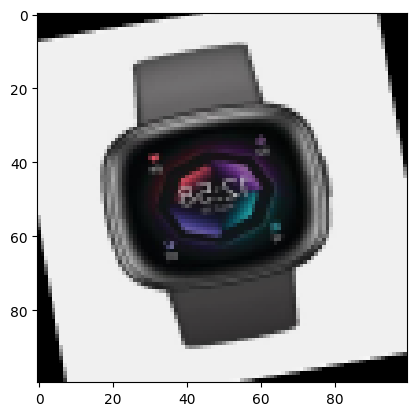

Image shape: (100, 100, 3)


In [14]:
# Plot image
plt.imshow(pooled_images['image'][1])
plt.show()

# Print image shape
print('Image shape:', pooled_images['image'][1].shape)

/home/berni/.local/lib/python3.11/site-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
/home/berni/.local/lib/python3.11/site-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
/home/berni/.local/lib/python3.11/site-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
/home/berni/.local/lib/python3.11/site-packages/sklearn/metrics/cluster/_supervised.py:64: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings

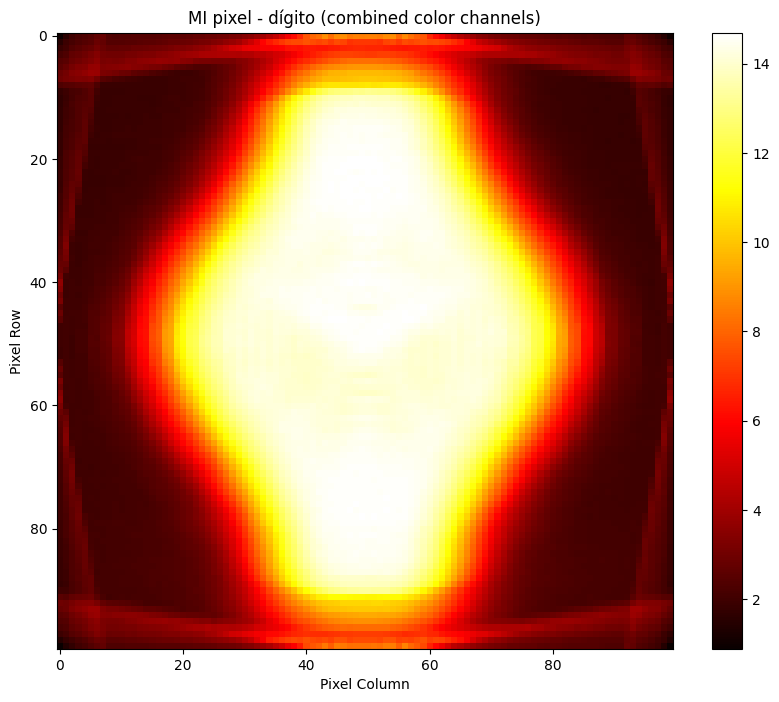

In [15]:
from sklearn.metrics import mutual_info_score
import numpy as np

# Definimos una función para calcular la información mutua para un pixel
def calculate_mi(i, j):
    # Extraemos los valores de los canales de color para el pixel actual
    pixel_values = [img[i, j, :] for img in pooled_images['image']]

    # Calculamos la información mutua para cada canal de color
    mi_values = [mutual_info_score(channel_values, pooled_images['label']) for channel_values in zip(*pixel_values)]

    return sum(mi_values)

# Creamos una matriz para almacenar los valores de información mutua
mutual_info_array = np.zeros((img_size//pooling_size, img_size//pooling_size))  # Eliminamos la dimensión para los canales de color


current_pixel = 0
for i in range(img_size//pooling_size):
    for j in range(img_size//pooling_size):
        # Calculamos la información mutua
        mutual_info_array[i, j] = calculate_mi(i, j)

# Visualizamos la información mutua
plt.figure(figsize=(10, 8))
plt.imshow(mutual_info_array, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('MI pixel - dígito (combined color channels)')
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.show()

In [16]:
print(mutual_info_array.shape)

(100, 100)


In [17]:
mi_threshold = np.percentile(mutual_info_array, 70)

high_mi_indices = np.where(mutual_info_array > mi_threshold)

min_row, max_row = np.min(high_mi_indices[0]), np.max(high_mi_indices[0])
min_col, max_col = np.min(high_mi_indices[1]), np.max(high_mi_indices[1])

reduced_images = [img[min_row:max_row, min_col:max_col, :] for img in pooled_images['image']]
reduced_mutual_info_array = mutual_info_array[min_row:max_row, min_col:max_col]


reduced_images_df = pd.DataFrame({'image': reduced_images, 'label': pooled_images['label'], 'label_range': pooled_images['label_range']})

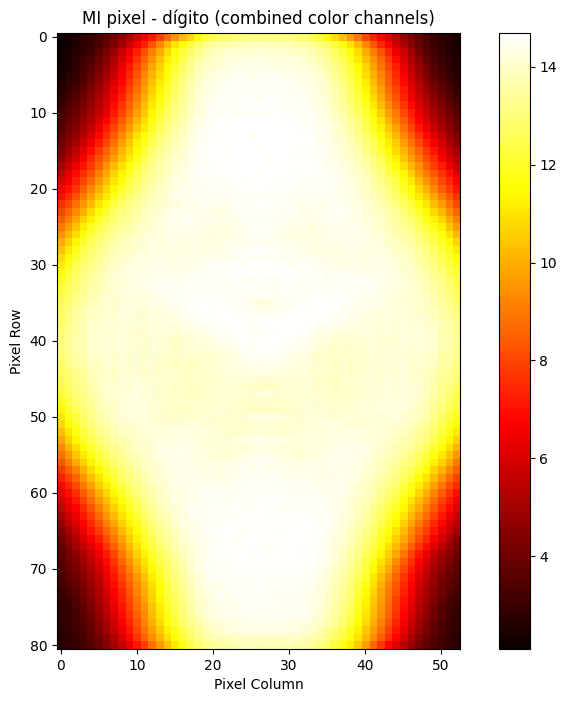

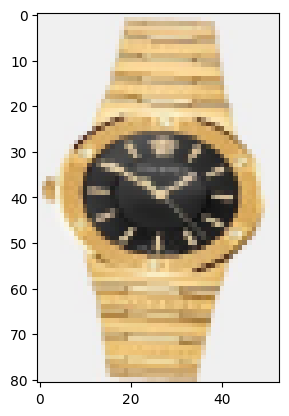

In [18]:
# Plot new reduced mutual information array.
plt.figure(figsize=(10, 8))
plt.imshow(reduced_mutual_info_array, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('MI pixel - dígito (combined color channels)')
plt.xlabel('Pixel Column')
plt.ylabel('Pixel Row')
plt.show()

# Plot reduced image.
plt.imshow(reduced_images_df['image'][0])

In [19]:
# Compare initial num pixels and reduced num pixels.
print('Initial num pixels:', img_size * img_size)
print('Reduced num pixels:', reduced_mutual_info_array.shape[0] * reduced_mutual_info_array.shape[1])
print('Row pixels:', reduced_mutual_info_array.shape[0])
print('Column pixels:', reduced_mutual_info_array.shape[1])

row_pixels = reduced_mutual_info_array.shape[0]
column_pixels = reduced_mutual_info_array.shape[1]

Initial num pixels: 160000
Reduced num pixels: 4293
Row pixels: 81
Column pixels: 53


Conseguimos una mayor reduccion que antes.

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from torchvision.datasets import MNIST
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(device)

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        # self.pool = nn.MaxPool2d(2, 2)
        # Ajusta el tamaño aquí para coincidir con el tamaño de salida de tu capa de pooling
        self.fc1 = nn.Linear(8 * row_pixels * column_pixels, 16) 
        self.fc2 = nn.Linear(16, 4) 
        self.fc3 = nn.Linear(4, 1)

    def forward(self, x):
        x = self.conv1(x)
        # x = self.pool(x)
        # Ajusta el redimensionamiento aquí según el tamaño real de tus tensores después del pooling
        x = x.view(-1, 8 * row_pixels * column_pixels)  # Ejemplo de ajuste
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        return x

# Calculate num parameters of the model.
model = CNN().to(device)
num_params = sum(p.numel() for p in model.parameters())
print('Number of parameters:', num_params)

cuda
Number of parameters: 549817


Aqui nos pasamos de los parámetros pero lo hemos creido necesario ya que para que el modelo se entrenara con las transformaciones aplicadas necesitaria ser más inteligente.

In [21]:
from torch.optim.lr_scheduler import StepLR

# Define the loss function and optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
criterion = nn.MSELoss()

def random_search(train_loader, model_prototype, criterion, num_epochs, num_trials, device):
    best_loss = float('inf')
    best_params = {}
    
    for trial in range(num_trials):
        # Generar valores aleatorios para los hiperparámetros
        lr = 10**np.random.uniform(-5, -1)  # Tasa de aprendizaje entre 1e-5 y 1e-1
        step_size = np.random.randint(5, 20)  # step_size entre 5 y 20
        gamma = np.random.uniform(0.01, 0.1)  # gamma entre 0.01 y 0.1
        
        print(f"Trial {trial+1}/{num_trials}: lr={lr}, step_size={step_size}, gamma={gamma}")
        
        # Crear una nueva instancia del modelo para cada prueba
        model = model_prototype().to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        # scheduler = StepLR(optimizer, step_size=step_size, gamma=gamma)
        
        trial_loss = train_model(model, train_loader, criterion, optimizer, scheduler, num_epochs, device)
        
        if trial_loss < best_loss:
            best_loss = trial_loss
            best_params = {'lr': lr, 'step_size': step_size, 'gamma': gamma}
            torch.save(model.state_dict(), 'best_model.pth')  # Guardar el mejor modelo
            
    return best_params, best_loss

def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device=device):
    for epoch in range(num_epochs):
        model.train()  # Poner el modelo en modo de entrenamiento
        running_loss = 0.0
        total_loss = 0.0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            
            outputs = model(inputs)
            loss = criterion(outputs, labels.view(-1, 1))  # Asegura que labels tiene la forma correcta
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            total_loss += loss.item() * inputs.size(0)
            
        # scheduler.step()  # Ajusta la tasa de aprendizaje
        evaluate_model(model, test_loader)

        average_loss = total_loss / len(train_loader.dataset) 
        epoch_loss = running_loss / len(train_loader.dataset)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')
    return average_loss

# Function to evaluate the model
def evaluate_model(model, test_loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
    avg_loss = total_loss / len(test_loader.dataset)
    print(f'RMSE: {np.sqrt(avg_loss):.4f}') 

In [22]:
X = reduced_images_df.drop(columns=['label', 'label_range'])
y = reduced_images_df['label']

# Print X and y.
print(X.head())
print(y.head())


                                               image
0  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
1  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
2  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
3  [[[0.9058821, 0.9058821, 0.9058821], [0.905882...
4  [[[0.9411765, 0.9411765, 0.9411765], [0.941176...
0    2780.00
1     449.95
2     399.00
3     349.00
4     549.00
Name: label, dtype: float64


In [23]:
# transform reduced images to loaders
X = torch.stack([torch.Tensor(i) for i in X.values.tolist()])
X = X.squeeze(1)
X = X.permute(0, 3, 1, 2)
y = torch.tensor(y.values, dtype=torch.float32)

# Print shapes of X and y.
print(X.shape)
print(y.shape)


torch.Size([2553, 3, 81, 53])
torch.Size([2553])


/tmp/ipykernel_145748/271543269.py:2: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /build/python-pytorch/src/pytorch-cuda/torch/csrc/utils/tensor_new.cpp:275.)
  X = torch.stack([torch.Tensor(i) for i in X.values.tolist()])


In [24]:
dataset = TensorDataset(X, y)
len(dataset)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

print('Train size:', train_size)
print('Test size:', test_size)

Train size: 2042
Test size: 511


In [25]:
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

print('Train dataset size:', len(train_dataset))
print('Test dataset size:', len(test_dataset))

Train dataset size: 2042
Test dataset size: 511


In [26]:
train_loader = DataLoader(train_dataset, batch_size=2042, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=511, shuffle=False)

print('Train loader size:', len(train_loader))
print('Test loader size:', len(test_loader))

Train loader size: 1
Test loader size: 1


In [27]:
# best_params, best_loss = random_search(train_loader, CNN, criterion, num_epochs=100, num_trials=20, device=device)

# print("Best Params:", best_params)
# print("Best Loss:", best_loss)

In [28]:
# Train the model
train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=3000)

/usr/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([511])) that is different to the input size (torch.Size([511, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RMSE: 624.4975
Epoch 1/3000, Loss: 385263.8125
RMSE: 621.8639
Epoch 2/3000, Loss: 382537.4688
RMSE: 618.7570
Epoch 3/3000, Loss: 379273.9062
RMSE: 615.3548
Epoch 4/3000, Loss: 375443.5000
RMSE: 611.5058
Epoch 5/3000, Loss: 371271.5625
RMSE: 607.1914
Epoch 6/3000, Loss: 366580.5938
RMSE: 602.3942
Epoch 7/3000, Loss: 361358.6875
RMSE: 597.0988
Epoch 8/3000, Loss: 355597.3750
RMSE: 591.2934
Epoch 9/3000, Loss: 349292.8125
RMSE: 584.9712
Epoch 10/3000, Loss: 342447.6250
RMSE: 578.1314
Epoch 11/3000, Loss: 335072.1562
RMSE: 570.7821
Epoch 12/3000, Loss: 327186.3750
RMSE: 562.9419
Epoch 13/3000, Loss: 318821.5312
RMSE: 554.6431
Epoch 14/3000, Loss: 310022.2812
RMSE: 545.9349
Epoch 15/3000, Loss: 300848.6875
RMSE: 536.8870
Epoch 16/3000, Loss: 291378.6250
RMSE: 527.5947
Epoch 17/3000, Loss: 281710.0312
RMSE: 518.1827
Epoch 18/3000, Loss: 271963.2812
RMSE: 508.8103
Epoch 19/3000, Loss: 262283.1250
RMSE: 499.6741
Epoch 20/3000, Loss: 252839.8125
RMSE: 491.0097
Epoch 21/3000, Loss: 243829.3750
R

27336.3515625

In [29]:
# Evaluate the model
evaluate_model(model, test_loader)

RMSE: 570.5957


El RMSE es mayor que en modelo anterior, sin embargo en la grafica que mostraremos a continuación veremos como este modelo nos da resultados mucho más satisfactorios.

images shape: torch.Size([511, 3, 81, 53])


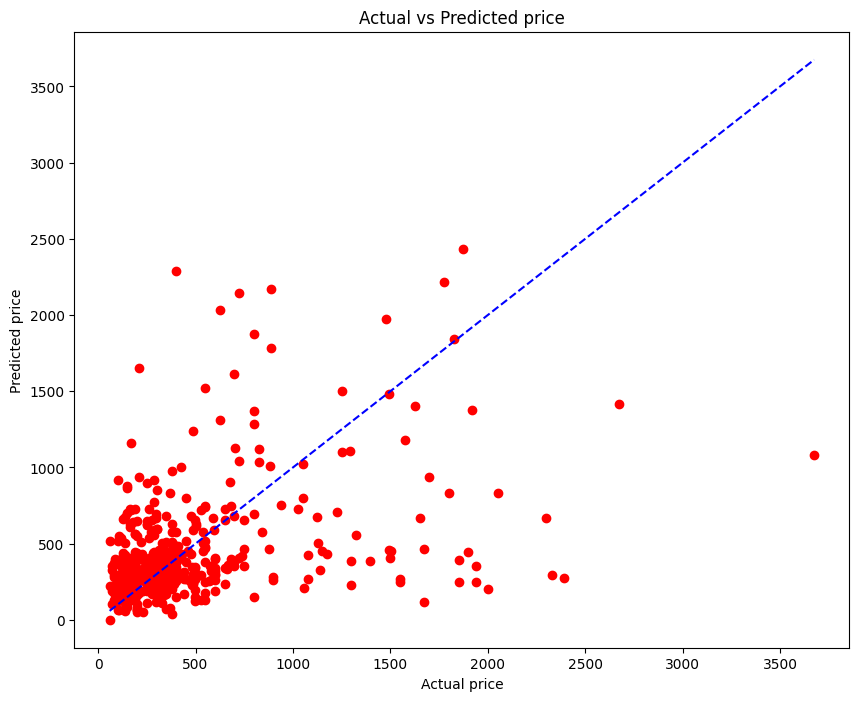

In [30]:
# Plot predictions vs actual prices
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        print('images shape:', images.shape)
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        break

outputs = outputs.cpu().numpy()
labels = labels.cpu().numpy()

plt.figure(figsize=(10, 8))
plt.scatter(labels, outputs, c='r')
plt.plot([min(labels), max(labels)], [min(labels), max(labels)], '--', c='b')
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Actual vs Predicted price')
plt.show()

Aqui las predicciones ya tienen un poco más de significado y aunque se pierde un poco con los valores grandes, en general podemos estar contentos con el resultado.

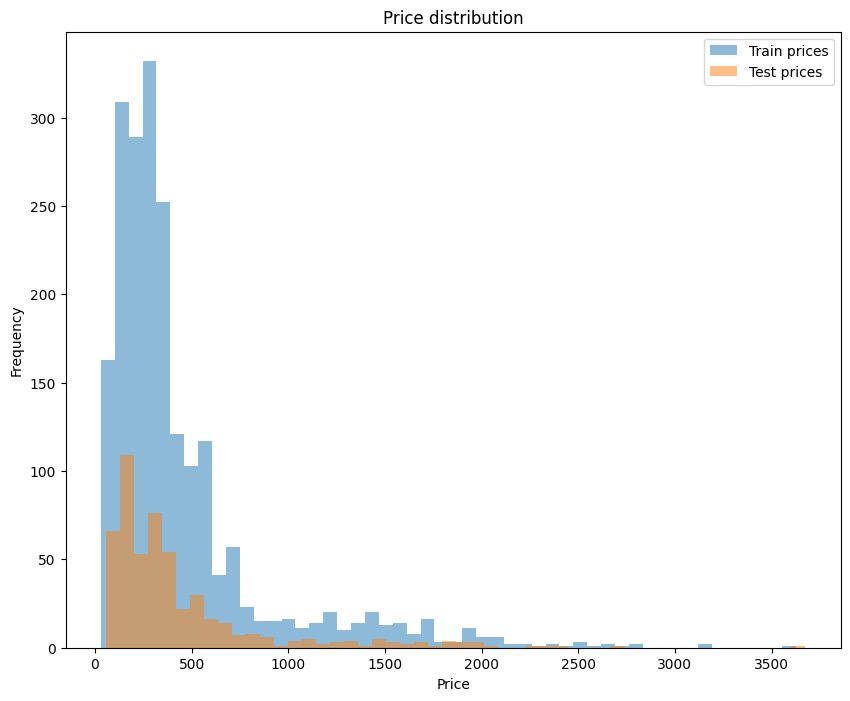

In [31]:
# Get chart of prices for training and test datasets.
train_prices = train_dataset[:][1].numpy()
test_prices = test_dataset[:][1].numpy()

plt.figure(figsize=(10, 8))
plt.hist(train_prices, bins=50, alpha=0.5, label='Train prices')
plt.hist(test_prices, bins=50, alpha=0.5, label='Test prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Price distribution')
plt.legend()
plt.show()

## Clasificacion

In [32]:
X = reduced_images_df.drop(columns=['label', 'label_range'])
y = reduced_images_df['label_range']

X = torch.stack([torch.Tensor(i) for i in X.values.tolist()])
X = X.squeeze(1)
X = X.permute(0, 3, 1, 2)
y = torch.tensor(y.values, dtype=torch.float32)

dataset = TensorDataset(X, y)
len(dataset)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=2042, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=511, shuffle=False)



In [33]:
print('Initial num pixels:', 512*406)
print('Reduced num pixels:', reduced_mutual_info_array.shape[0] * reduced_mutual_info_array.shape[1])
print('Row pixels:', reduced_mutual_info_array.shape[0])
print('Column pixels:', reduced_mutual_info_array.shape[1])

Initial num pixels: 207872
Reduced num pixels: 4293
Row pixels: 81
Column pixels: 53


Para hacer la clasificacion tendremos que cambiar un par de cosas de la red neuronal, como las neuronas de salida y el criterion.

In [34]:
# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#device = torch.device('cpu')

print(device)

# Define the CNN model
class CNN2(nn.Module):
    def __init__(self):
        super(CNN2, self).__init__()
        self.conv1 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(8, 32, kernel_size=3, padding=1)
        #self.pool = nn.MaxPool2d(1, 1)
        # Ajusta el tamaño aquí para coincidir con el tamaño de salida de tu capa de pooling
        self.fc1 = nn.Linear(32 * row_pixels * column_pixels, 32) 
        self.fc2 = nn.Linear(32, 16)
        self.fc3 = nn.Linear(16, 9) 

    def forward(self, x):
        #x = x.squeeze(1)
        #x = x.permute(0, 3, 1, 2)
        x = self.conv1(x)
        x = self.conv2(x)
        #x = self.pool(x)
        x = x.view(-1, 32 * row_pixels * column_pixels)  # Ejemplo de ajuste
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Calculate num parameters of the model.
model = CNN2().to(device)
num_params = sum(p.numel() for p in model.parameters())
print('Number of parameters:', num_params)

cuda
Number of parameters: 4399305


In [35]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

criterion = nn.CrossEntropyLoss()  # Use Mean Squared Error loss for regression
optimizer = optim.Adam(model.parameters(), lr=0.004)

def train_model(model, train_loader, criterion, optimizer, num_epochs=10):
    model.train()

    train_losses = []
    train_accuracies = []

    for epoch in range(num_epochs):
        train_loss = 0.0
        correct_train = 0
        total_train = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels.long())
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)

        train_loss /= len(train_loader.dataset)
        train_losses.append(train_loss)
        
        train_accuracy = correct_train / total_train
        train_accuracies.append(train_accuracy)

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.4f}')

    return train_losses, train_accuracies


def evaluate_model(model, test_loader, criterion):
    model.eval()
    total_loss = 0.0
    correct_test = 0
    total_test = 0
    all_preds = []
    true_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels.long())
            total_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)
            correct_test += (predicted == labels).sum().item()
            total_test += labels.size(0)

            all_preds.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / len(test_loader.dataset)
    test_accuracy = correct_test / total_test

    print(f'Test Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')
    
    cm = confusion_matrix(true_labels, all_preds)

            # Visualizando la matriz de confusión
    plt.figure(figsize=(9,7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.xlabel('Predicciones')
    plt.ylabel('Verdaderas')
    plt.title('Matriz de Confusión')
    plt.show()

    
    

    return avg_loss, test_accuracy

In [36]:
train_model(model, train_loader, criterion, optimizer, num_epochs=200)

Epoch [1/200], Loss: 2.1909, Accuracy: 0.0348
Epoch [2/200], Loss: 7.7348, Accuracy: 0.0059
Epoch [3/200], Loss: 1.9823, Accuracy: 0.7375
Epoch [4/200], Loss: 1.4664, Accuracy: 0.7375
Epoch [5/200], Loss: 1.0467, Accuracy: 0.7375
Epoch [6/200], Loss: 1.2674, Accuracy: 0.7199
Epoch [7/200], Loss: 1.0628, Accuracy: 0.7375
Epoch [8/200], Loss: 1.3567, Accuracy: 0.7375
Epoch [9/200], Loss: 1.1040, Accuracy: 0.7375
Epoch [10/200], Loss: 0.9826, Accuracy: 0.7375
Epoch [11/200], Loss: 1.0780, Accuracy: 0.7375
Epoch [12/200], Loss: 0.9844, Accuracy: 0.7287
Epoch [13/200], Loss: 0.9287, Accuracy: 0.7375
Epoch [14/200], Loss: 0.9619, Accuracy: 0.7375
Epoch [15/200], Loss: 1.0167, Accuracy: 0.7375
Epoch [16/200], Loss: 0.9785, Accuracy: 0.7375
Epoch [17/200], Loss: 0.9297, Accuracy: 0.7375
Epoch [18/200], Loss: 0.8911, Accuracy: 0.7375
Epoch [19/200], Loss: 0.9060, Accuracy: 0.7375
Epoch [20/200], Loss: 0.9321, Accuracy: 0.7375
Epoch [21/200], Loss: 0.9177, Accuracy: 0.7375
Epoch [22/200], Loss: 

([2.1909217834472656,
  7.734759330749512,
  1.982322096824646,
  1.4664385318756104,
  1.0467349290847778,
  1.2674297094345093,
  1.062785267829895,
  1.3566569089889526,
  1.1039727926254272,
  0.9826242327690125,
  1.0779744386672974,
  0.9843653440475464,
  0.9286661744117737,
  0.9619166851043701,
  1.0166631937026978,
  0.9785462617874146,
  0.9296584129333496,
  0.8911194801330566,
  0.9059931039810181,
  0.9321072697639465,
  0.9177173376083374,
  0.8916832208633423,
  0.906303882598877,
  0.8921524882316589,
  0.8849453330039978,
  0.885610818862915,
  0.8878374695777893,
  0.8892111778259277,
  0.8883184790611267,
  0.8864548802375793,
  0.8826881051063538,
  0.879596471786499,
  0.8836795091629028,
  0.8796182870864868,
  0.8735905289649963,
  0.8673495054244995,
  0.8644970059394836,
  0.8633763790130615,
  0.8621864318847656,
  0.8667035102844238,
  0.9289703965187073,
  0.9021942019462585,
  1.0297636985778809,
  1.0295454263687134,
  0.9248224496841431,
  0.890801608562

Test Loss: 0.9045, Test Accuracy: 0.7280


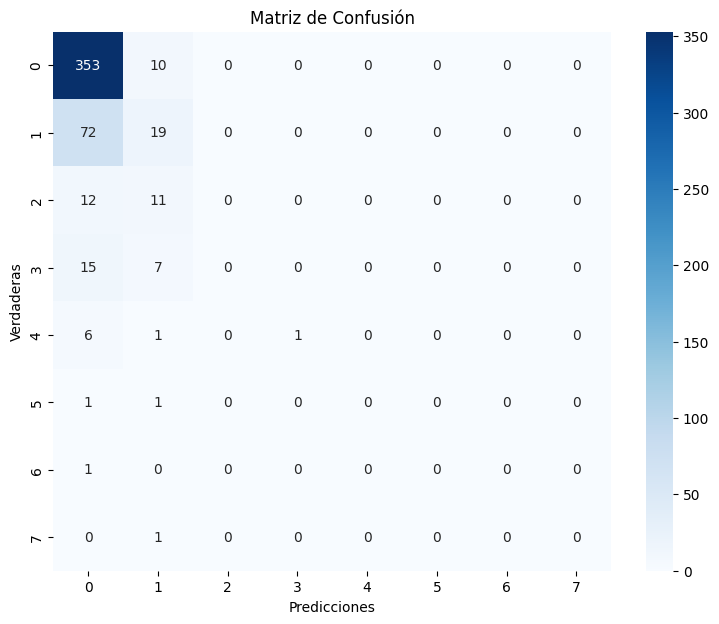

(0.904491662979126, 0.7279843444227005)

In [37]:
evaluate_model(model, test_loader, criterion)

Observamos como el accuracy no esta mal y clasifica correctamente la mayoria de muestras, dependiendo de la ejecucion suele ser mejor o peor pero en general podriamos usarlo como un rango de precio orientativo.

## Conclusiones

Despues de este fin de semana de puro pelearse con imágenes de relojes hemos aprendido una serie de cosas. Algunas con poco sentido como que a veces algo no funcionará por el simple hecho de que no le apetece, pero otras más útiles como el como aplicar una transformación a los datos, entender completamente como funcionan las convoluciones y el pooling, y la más útil de todas, como hacer y girar una tortilla de 9 huevos 4 patatas y 2 cebollas (no veas como pesaba eso).

Pero una de las cosas que nos ha dejado con un mal gusto de boca es que no sentimos que hayamos llegado a conseguir un resultado completamente satisfactorio, ya que incluso en nuestro mejor resultado, las predicciones seguían teniendo mucho error, por ello nos gustaría si pudieras pasarnos un notebook con una solución más óptima para ver que más podríamos haber hecho para conseguir mejores resultados.

En general lo que hemos visto ha sido:
* Una primera regresión donde conseguiamos el menor error, sin embargo nuestras predicciones no superaban nunca el valor de 500€, por ello decidimos que no sería aplicable en un escenario real.
* Una segunda regresión donde esta vez aplicamos ciertas transformaciones a los datos y conseguiamos resultados más satisfactorios aunque con un mayor error.
* Una clasificacion por rangos de precios aprovechando los datos transformados usados para la segunda regresión donde conseguimos una precisión razonablemente buena, sin embargo no dejaban de ser rangos orientativos bastante grandes y la mayoria de las muestras se centraban en el primero.